# Truncated Analysis


In [12]:
from pathlib import Path
import os
import re

import numpy as np
import pandas as pd

from HW_HD_utils import *
from plots_utils import *
from create_npy_file import create_npy_file, create_grouped_npy_files, create_npy_file_truncated


def information(data):
    print(f"The shape of the data is: {data.shape}")
    print(f"The type of the data is: {data.dtype}")
    print(f"The first 2 traces are: {data[:2]}")
    print(f"If there are any NaN values: {np.isnan(data).any()}")


In [13]:
truncated_registers = ["r2", "r3", "r4", "r5", "r6"]
truncated_trace_dir = "output_decapsulation_truncated_TRIM"
result_dir_truncated = "Results_decapsulation_truncated"

reset_result_dir = False
if reset_result_dir:
    reset_folder(result_dir_truncated)
os.makedirs(result_dir_truncated, exist_ok=True)

rebuild_npy = False

if rebuild_npy:
    create_npy_file_truncated(f"{result_dir_truncated}/HW_SUBTRACE", truncated_trace_dir, "HW", truncated_registers)
    create_npy_file_truncated(f"{result_dir_truncated}/HD_SUBTRACE", truncated_trace_dir, "HD", truncated_registers)


In [14]:
data_HW_truncated = {}
print("Information HW truncated")
print("------------------------")
for file in sorted(Path(result_dir_truncated).glob("HW_SUBTRACE_xs*.npy")):
    match = re.search(r"xs(\d+)", file.stem)
    xs_id = int(match.group(1))
    data_HW_truncated[xs_id] = np.load(file)
    information(data_HW_truncated[xs_id])

data_HD_truncated = {}

print("\nnformation HD truncated")
print("------------------------")
for file in sorted(Path(result_dir_truncated).glob("HD_SUBTRACE_xs*.npy")):
    match = re.search(r"xs(\d+)", file.stem)
    xs_id = int(match.group(1))
    data_HD_truncated[xs_id] = np.load(file)
    information(data_HD_truncated[xs_id])


Information HW truncated
------------------------
The shape of the data is: (80, 3616)
The type of the data is: float64
The first 2 traces are: [[11. 11. 11. ... 17. 17. 17.]
 [11. 11. 11. ... 16. 16. 16.]]
If there are any NaN values: False
The shape of the data is: (80, 3616)
The type of the data is: float64
The first 2 traces are: [[12. 12. 12. ... 17. 17. 17.]
 [17. 17. 17. ... 16. 16. 16.]]
If there are any NaN values: False
The shape of the data is: (80, 3616)
The type of the data is: float64
The first 2 traces are: [[12. 12. 12. ... 17. 17. 17.]
 [17. 17. 17. ... 16. 16. 16.]]
If there are any NaN values: False
The shape of the data is: (80, 3616)
The type of the data is: float64
The first 2 traces are: [[12. 12. 12. ... 17. 17. 17.]
 [17. 17. 17. ... 16. 16. 16.]]
If there are any NaN values: False
The shape of the data is: (80, 3616)
The type of the data is: float64
The first 2 traces are: [[12. 12. 12. ... 17. 17. 17.]
 [17. 17. 17. ... 16. 16. 16.]]
If there are any NaN valu

In [15]:
def load_B(run_index, B_folder, prefix="B"):
    path = Path(B_folder) / f"{prefix}_{run_index}.csv"
    if not path.exists():
        raise FileNotFoundError(f"Missing B file: {path}")
    df = pd.read_csv(path)
    value_cols = [col for col in df.columns if col != "row"]
    return df[value_cols].to_numpy(dtype=np.float64)


def load_all_B(B_folder, prefix="B"):
    pattern = re.compile(rf"{re.escape(prefix)}_(\d+)\.csv$")
    files = []

    for path in Path(B_folder).glob(f"{prefix}_*.csv"):
        match = pattern.fullmatch(path.name)
        if match is not None:
            files.append((int(match.group(1)), path))

    files.sort(key=lambda item: item[0])
    runs = [run_index for run_index, _ in files]
    B_all = np.array([load_B(run_index, B_folder, prefix=prefix) for run_index in runs])
    return B_all, runs


In [ ]:
B_folder = Path("output_decapsulation_truncated/B")
B_all, B_runs = load_all_B(B_folder, prefix="B")
B_from_registers, B_register_runs = load_all_B(B_folder, prefix="B_from_registers")

try:
    B_packed_from_registers, B_packed_runs = load_all_B(B_folder, prefix="B_from_registers_packed")
except FileNotFoundError:
    B_packed_from_registers = None
    B_packed_runs = []

xs_id = 0
traces_hw = data_HW_truncated[xs_id]
traces_hd = data_HD_truncated[xs_id]

B_base = {"ciphertext": B_all, "registers": B_from_registers}
if B_packed_from_registers is not None:
    B_base["registers_packed"] = B_packed_from_registers

no_columns_B = 10
B_row = xs_id

for B_name, B_values in B_base.items():
    corr_hw_array = {}
    columns_to_plot = min(no_columns_B, B_values.shape[2])

    for B_col in range(columns_to_plot):
        register_values = B_values[:, B_row, B_col]
        target_hw_values = hw_u32(register_values.astype(np.uint32))
        corr_hw_array[f"B_col_{B_col}"] = compute_correlation(traces_hw, target_hw_values)

    plot_correlation(
        corr_hw_array,
        f"Correlation HW with first {columns_to_plot} B columns ({B_name}) for xs_id {xs_id}",
        os.path.join(result_dir_truncated, f"correlation_HW_first_{columns_to_plot}_B_cols_{B_name}_xs{xs_id}.png")
    )


Plotting xs_id = 0


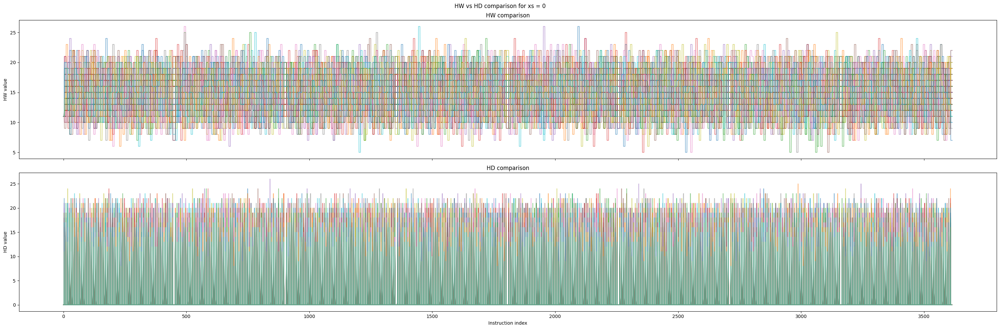

Plotting xs_id = 1


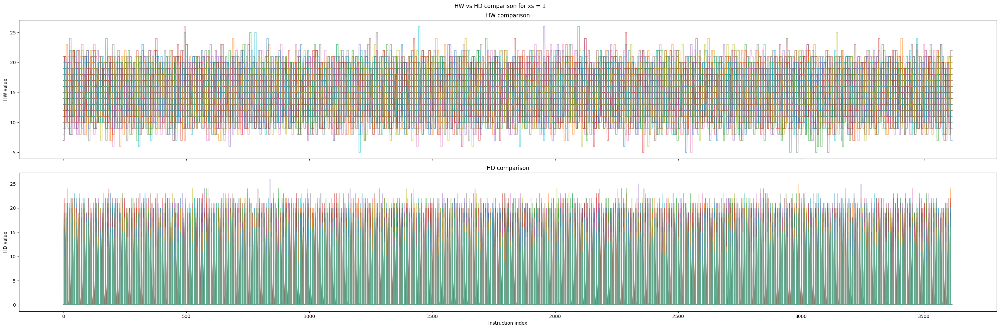

Plotting xs_id = 2


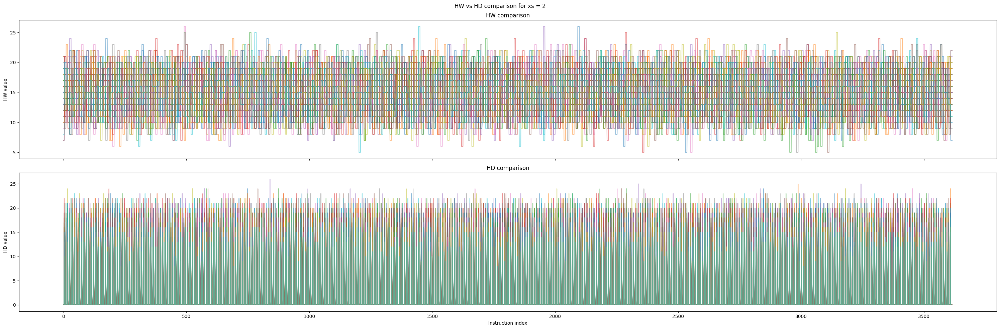

Plotting xs_id = 3


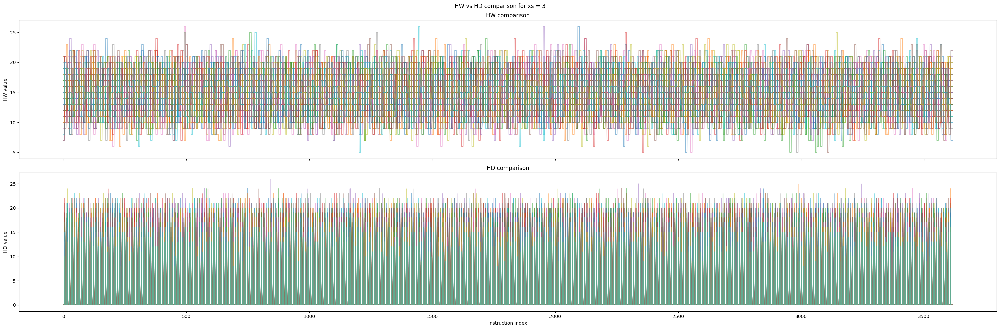

Plotting xs_id = 4


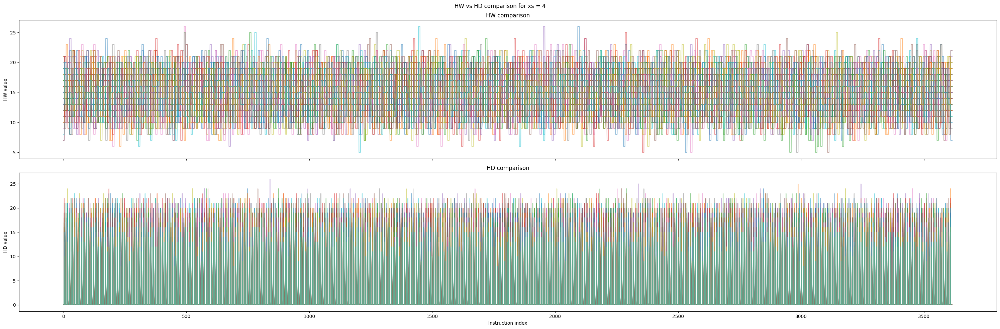

Plotting xs_id = 5


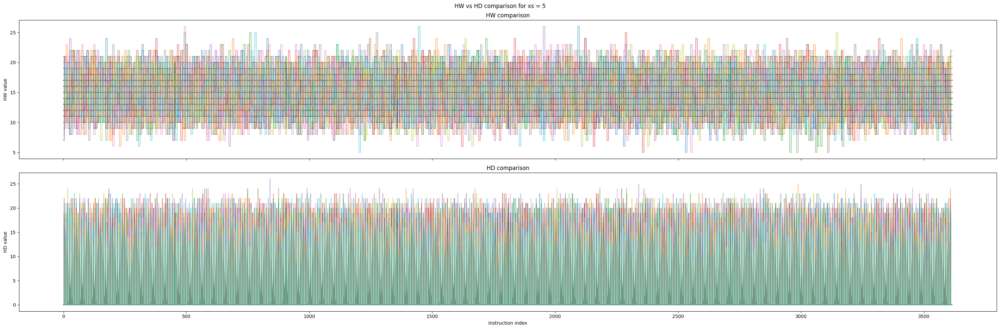

Plotting xs_id = 6


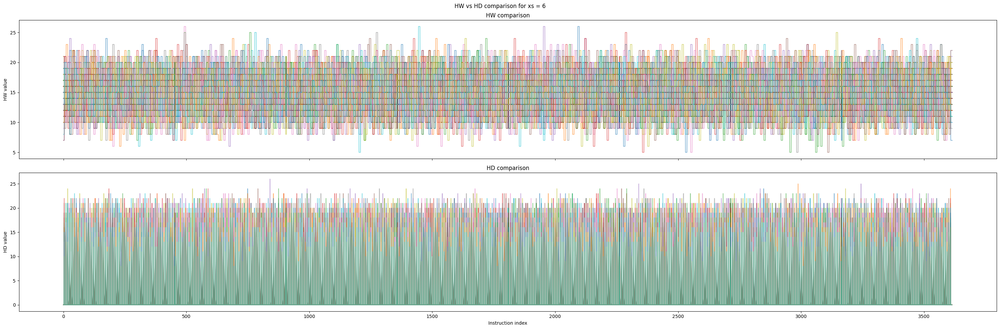

Plotting xs_id = 7


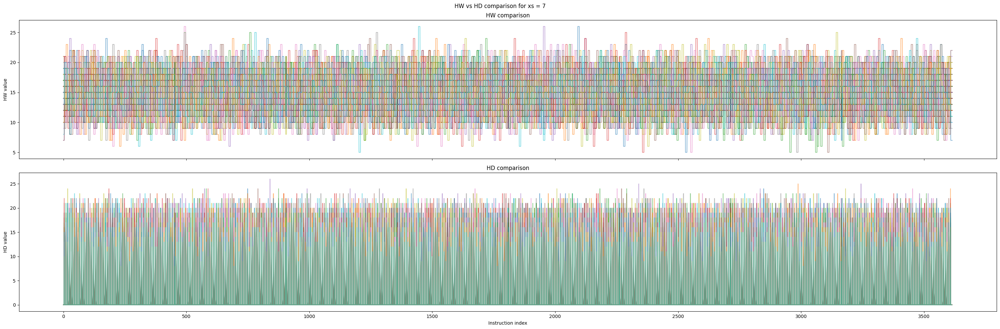

In [ ]:
for xs_id in sorted(data_HW_truncated.keys()):
    print(f"Plotting xs_id = {xs_id}")
    plot_hw_hd_comparison(
        data_HW_truncated[xs_id],
        data_HD_truncated[xs_id],
        title=f"HW vs HD comparison for xs = {xs_id}",
        save_path=os.path.join(result_dir_truncated, f"hw_hd_comparison_xs{xs_id}.png"),
        max_traces=None,
    )
